In [4]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sentence_transformers import SentenceTransformer
import streamlit as st
import plotly.express as px

# Load weak-labeled dataset
df = pd.read_csv("dataset_with_entities_and_weaklabels.csv")

# Ensure predicted_entities column exists (list of ADEs per row)
df['predicted_entities'] = df['ADE'].apply(lambda x: eval(x) if isinstance(x,str) else [])

# Age bucket
def classify_age_group(age):
    if pd.isna(age):
        return 'Unknown'
    elif age < 18:
        return 'Child'
    elif age < 60:
        return 'Adult'
    return 'Senior'

df['age_group'] = df['AGE_YRS'].apply(classify_age_group)

In [3]:
pip install sentence_transformers 


Note: you may need to restart the kernel to use updated packages.


In [5]:
# Simple regex-based modifier detection around ADE spans
modifier_map = {'high': ['severe','critical','life-threatening'],
                'medium': ['moderate','persistent','significant'],
                'low': ['mild','slight','minor']}

def detect_modifier(text, ade):
    if not ade: return 'medium'  # default
    ade_lower = [a.lower() for a in ade]
    text_lower = text.lower()
    for level, words in modifier_map.items():
        for w in words:
            if w in text_lower:
                return level
    return 'medium'

df['modifier'] = df.apply(lambda r: detect_modifier(r['SYMPTOM_TEXT'], r['predicted_entities']), axis=1)

modifier_num = {'low':0,'medium':1,'high':2}
df['modifier_num'] = df['modifier'].map(modifier_num)

In [6]:
model_embed = SentenceTransformer("all-MiniLM-L6-v2")

# Flatten ADEs into one string per row
df['ade_text'] = df['predicted_entities'].apply(lambda x: " ".join(x) if x else "")

# Generate embeddings
embeddings = model_embed.encode(df['ade_text'].tolist(), normalize_embeddings=True)

In [7]:
# Age as numeric feature
age_num = df['AGE_YRS'].fillna(35).to_numpy().reshape(-1,1)/100.0

# Modifier as numeric feature
modifier_feat = df['modifier_num'].to_numpy().reshape(-1,1)

# Feature matrix = embeddings + age + modifier
X = np.hstack([embeddings, age_num, modifier_feat])

# KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
df['cluster'] = kmeans.fit_predict(X)

In [8]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(embeddings)
df['x'] = X_tsne[:,0]
df['y'] = X_tsne[:,1]

hover_text = [
    f"ADEs: {ade}<br>Age: {age}<br>Modifier: {mod}<br>Severity: {sev}"
    for ade, age, mod, sev in zip(df['predicted_entities'], df['age_group'], df['modifier'], df['weak_label'])
]

2025-10-04 16:22:11.710 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:11.712 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:11.887 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:11.893 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:11.910 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:11.913 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


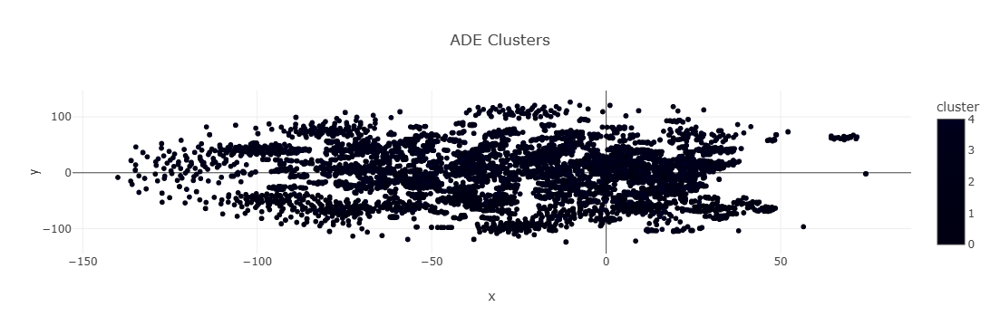

2025-10-04 16:22:12.297 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.298 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.409 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.410 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.416 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.446 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


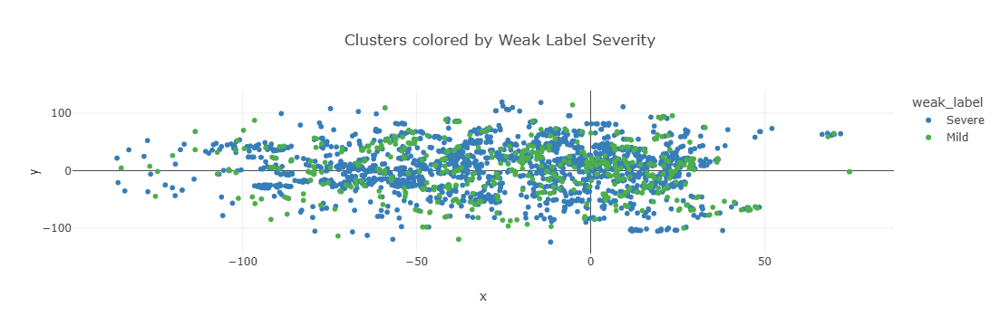

2025-10-04 16:22:12.533 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.535 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.825 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.832 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.857 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-10-04 16:22:12.860 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.


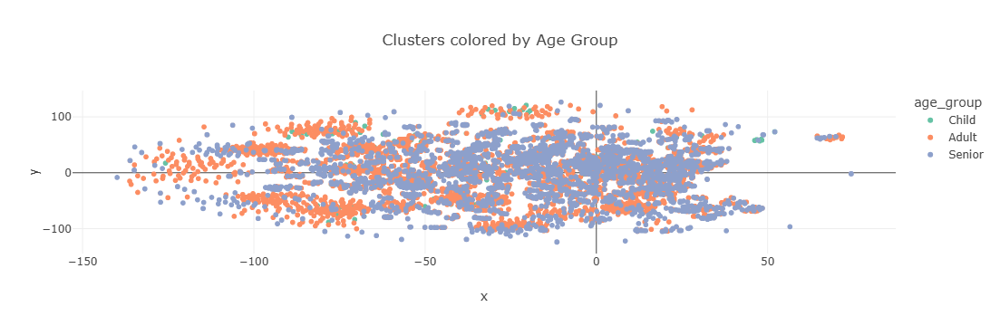

In [11]:
st.subheader("Clusters by KMeans")
fig1 = px.scatter(df, x='x', y='y', color='cluster',
                  hover_name=hover_text,
                  title="ADE Clusters")
st.plotly_chart(fig1, use_container_width=True)
fig1.show()
st.subheader("Clusters by Severity")
fig2 = px.scatter(df, x='x', y='y', color='weak_label',
                  hover_name=hover_text,
                  color_discrete_sequence=px.colors.qualitative.Set1,
                  title="Clusters colored by Weak Label Severity")
st.plotly_chart(fig2, use_container_width=True)
fig2.show()
st.subheader("Clusters by Age Group")
fig3 = px.scatter(df, x='x', y='y', color='age_group',
                  hover_name=hover_text,
                  color_discrete_sequence=px.colors.qualitative.Set2,
                  title="Clusters colored by Age Group")
st.plotly_chart(fig3, use_container_width=True)
fig3.show()